<a href="https://colab.research.google.com/github/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/blob/main/Turbine_Energy_Yield_Prediction_for_Gas_Turbine_Optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#About The Project

This project uses machine learning to predict Turbine Energy Yield (TEY) from gas turbine data, Predict TEY to identify operational conditions and turbine settings that maximize energy output.
Ensures the power plant operates at its highest efficiency, reducing fuel consumption and operational costs. Use TEY predictions to identify when the system might deviate from normal operating conditions, signaling potential issues like:
Degradation of turbine components.

# About The Dataset

The dataset contains 36733 instances of 11 sensor measures aggregated over one hour (by means of average or sum) from a gas turbine located in Turkey's north western region for the purpose of studying flue gas emissions, namely CO and NOx (NO + NO2). The data comes from the same power plant as the dataset (http://archive.ics.uci.edu/ml/datasets/Combined+Cycle+Power+Plant) used for predicting hourly net energy yield. By contrast, this data is collected in another data range (01.01.2011 - 31.12.2015), includes gas turbine parameters (such as Turbine Inlet Temperature and Compressor Discharge pressure) in addition to the ambient variables. Note that the dates are not given in the instances but the data are sorted in chronological order. See the attribute information and relevant paper for details. Kindly follow the protocol mentioned in the paper (using the first three years' data for training/ cross-validation and the last two for testing) for reproducibility and comparability of works. The dataset can be well used for predicting turbine energy yield (TEY) using ambient variables as features.

## Features

The explanations of sensor measurements and their brief statistics are given below.

|Variable (Abbr.)| Unit | Min | Max | Mean|
|----------------|------|-----|-----|-----|
|Ambient temperature (AT)| C |6.23 |37.10| 17.71|
|Ambient pressure (AP)| mbar| 985.85| 1036.56 |1013.07|
|Ambient humidity (AH)| (%) |24.08 |100.20 |77.87|
|Air filter difference pressure (AFDP)| mbar| 2.09| 7.61| 3.93|
|Gas turbine exhaust pressure (GTEP)| mbar| 17.70| 40.72| 25.56|
|Turbine inlet temperature (TIT)| C |1000.85| 1100.89| 1081.43|
|Turbine after temperature (TAT)| C |511.04 |550.61| 546.16|
|Compressor discharge pressure (CDP)| mbar| 9.85| 15.16| 12.06|
|Turbine energy yield (TEY) |MWH |100.02| 179.50| 133.51|
|Carbon monoxide (CO)| mg/m3| 0.00| 44.10| 2.37|
|Nitrogen oxides (NOx)| mg/m3| 25.90| 119.91| 65.29|


#Data Preprocessing and  Visualization

##Download Datasets for training "gt_2011.csv, gt_2012.csv,gt_2013.csv"

In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2011.csv

--2024-12-01 15:52:03--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2011.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 562921 (550K) [text/plain]
Saving to: ‘gt_2011.csv’

gt_2011.csv         100%[===================>] 549.73K  --.-KB/s    in 0.05s   

2024-12-01 15:52:04 (10.8 MB/s) - ‘gt_2011.csv’ saved [562921/562921]



In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2012.csv

--2024-12-01 15:52:04--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2012.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 577617 (564K) [text/plain]
Saving to: ‘gt_2012.csv’

gt_2012.csv         100%[===================>] 564.08K  --.-KB/s    in 0.05s   

2024-12-01 15:52:04 (11.3 MB/s) - ‘gt_2012.csv’ saved [577617/577617]



In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2013.csv

--2024-12-01 15:52:05--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2013.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 540334 (528K) [text/plain]
Saving to: ‘gt_2013.csv’

gt_2013.csv         100%[===================>] 527.67K  --.-KB/s    in 0.05s   

2024-12-01 15:52:05 (9.57 MB/s) - ‘gt_2013.csv’ saved [540334/540334]



## Download Datasets for testing "gt_2014.csv, gt_2015.csv"

In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2014.csv

--2024-12-01 15:52:05--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2014.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 541009 (528K) [text/plain]
Saving to: ‘gt_2014.csv’

gt_2014.csv         100%[===================>] 528.33K  --.-KB/s    in 0.05s   

2024-12-01 15:52:05 (11.0 MB/s) - ‘gt_2014.csv’ saved [541009/541009]



In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2015.csv

--2024-12-01 15:52:05--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2015.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 556928 (544K) [text/plain]
Saving to: ‘gt_2015.csv’

gt_2015.csv         100%[===================>] 543.88K  --.-KB/s    in 0.05s   

2024-12-01 15:52:06 (11.1 MB/s) - ‘gt_2015.csv’ saved [556928/556928]



##Import Modules

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler

## load data for train and concat dataframes

In [ ]:
df1=pd.read_csv("gt_2011.csv")
df2=pd.read_csv("gt_2012.csv")
df3=pd.read_csv("gt_2013.csv")

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7411 entries, 0 to 7410
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7411 non-null   float64
 1   AP      7411 non-null   float64
 2   AH      7411 non-null   float64
 3   AFDP    7411 non-null   float64
 4   GTEP    7411 non-null   float64
 5   TIT     7411 non-null   float64
 6   TAT     7411 non-null   float64
 7   TEY     7411 non-null   float64
 8   CDP     7411 non-null   float64
 9   CO      7411 non-null   float64
 10  NOX     7411 non-null   float64
dtypes: float64(11)
memory usage: 637.0 KB


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7628 entries, 0 to 7627
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7628 non-null   float64
 1   AP      7628 non-null   float64
 2   AH      7628 non-null   float64
 3   AFDP    7628 non-null   float64
 4   GTEP    7628 non-null   float64
 5   TIT     7628 non-null   float64
 6   TAT     7628 non-null   float64
 7   TEY     7628 non-null   float64
 8   CDP     7628 non-null   float64
 9   CO      7628 non-null   float64
 10  NOX     7628 non-null   float64
dtypes: float64(11)
memory usage: 655.7 KB


In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7152 entries, 0 to 7151
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7152 non-null   float64
 1   AP      7152 non-null   float64
 2   AH      7152 non-null   float64
 3   AFDP    7152 non-null   float64
 4   GTEP    7152 non-null   float64
 5   TIT     7152 non-null   float64
 6   TAT     7152 non-null   float64
 7   TEY     7152 non-null   float64
 8   CDP     7152 non-null   float64
 9   CO      7152 non-null   float64
 10  NOX     7152 non-null   float64
dtypes: float64(11)
memory usage: 614.8 KB


In [ ]:
#concat dataframes along rows
df = pd.concat([df1, df2, df3], ignore_index=True,axis=0)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


## Load data for test and concat dataframes

In [ ]:
df4=pd.read_csv("gt_2014.csv")
df5=pd.read_csv("gt_2015.csv")

In [ ]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7158 entries, 0 to 7157
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7158 non-null   float64
 1   AP      7158 non-null   float64
 2   AH      7158 non-null   float64
 3   AFDP    7158 non-null   float64
 4   GTEP    7158 non-null   float64
 5   TIT     7158 non-null   float64
 6   TAT     7158 non-null   float64
 7   TEY     7158 non-null   float64
 8   CDP     7158 non-null   float64
 9   CO      7158 non-null   float64
 10  NOX     7158 non-null   float64
dtypes: float64(11)
memory usage: 615.3 KB


In [ ]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7384 entries, 0 to 7383
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7384 non-null   float64
 1   AP      7384 non-null   float64
 2   AH      7384 non-null   float64
 3   AFDP    7384 non-null   float64
 4   GTEP    7384 non-null   float64
 5   TIT     7384 non-null   float64
 6   TAT     7384 non-null   float64
 7   TEY     7384 non-null   float64
 8   CDP     7384 non-null   float64
 9   CO      7384 non-null   float64
 10  NOX     7384 non-null   float64
dtypes: float64(11)
memory usage: 634.7 KB


In [ ]:
#concat dataframes along rows
test_df = pd.concat([df4, df5], ignore_index=True,axis=0)

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14542 entries, 0 to 14541
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      14542 non-null  float64
 1   AP      14542 non-null  float64
 2   AH      14542 non-null  float64
 3   AFDP    14542 non-null  float64
 4   GTEP    14542 non-null  float64
 5   TIT     14542 non-null  float64
 6   TAT     14542 non-null  float64
 7   TEY     14542 non-null  float64
 8   CDP     14542 non-null  float64
 9   CO      14542 non-null  float64
 10  NOX     14542 non-null  float64
dtypes: float64(11)
memory usage: 1.2 MB


## Understand the Data Structure

In [ ]:
df.head() #train data

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028


In [ ]:
test_df.head() #test data

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,8.8358,1022.2,98.762,3.2422,23.152,1067.5,549.94,126.16,11.381,1.9157,68.292
1,9.0529,1021.8,97.464,3.2074,23.207,1067.9,549.80,126.51,11.476,2.0596,68.610
2,9.2464,1021.3,96.494,3.2051,23.296,1068.5,549.89,126.96,11.555,2.1621,68.324
3,9.3792,1020.9,95.912,3.2159,23.465,1069.6,549.94,127.83,11.539,2.1214,67.619
4,9.5757,1020.8,95.412,3.1898,23.205,1068.1,549.83,126.56,11.484,2.1549,66.499


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


The df contains 22191 rows and 11 columns no null values present and dtype is float64  

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14542 entries, 0 to 14541
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      14542 non-null  float64
 1   AP      14542 non-null  float64
 2   AH      14542 non-null  float64
 3   AFDP    14542 non-null  float64
 4   GTEP    14542 non-null  float64
 5   TIT     14542 non-null  float64
 6   TAT     14542 non-null  float64
 7   TEY     14542 non-null  float64
 8   CDP     14542 non-null  float64
 9   CO      14542 non-null  float64
 10  NOX     14542 non-null  float64
dtypes: float64(11)
memory usage: 1.2 MB


The test_df contains 14542 rows and 11 columns no null values present and dtype is float64

In [ ]:
df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.812607,79.555224,4.037750,25.317873,1083.080280,545.520170,133.537393,12.060208,2.214390,68.776529
std,7.352789,6.396588,13.915018,0.810223,4.234147,16.840765,7.708708,16.026107,1.114265,2.295746,11.036231
min,0.289850,985.850000,27.504000,2.087400,17.878000,1000.800000,512.450000,100.170000,9.875400,0.000388,27.765000
25%,11.664500,1008.800000,70.294500,3.449850,22.736000,1074.600000,542.600000,124.260000,11.395000,0.995375,61.548000
50%,17.739000,1012.400000,82.781000,4.068800,24.989000,1088.100000,549.900000,133.770000,12.001000,1.524200,67.096000
75%,23.657000,1016.700000,90.532000,4.451400,26.839000,1095.300000,550.050000,138.645000,12.443500,2.542400,74.572000
max,34.929000,1034.200000,100.200000,7.610600,37.402000,1100.800000,550.610000,174.610000,15.081000,44.103000,119.910000


In [ ]:
test_df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000
mean,17.713458,1013.463197,75.290819,3.754252,25.939087,1078.906842,547.132631,133.459114,12.061010,2.613695,59.977327
std,7.589885,6.544624,14.893508,0.680248,4.108871,18.262380,5.100267,14.975901,1.048775,2.189435,10.577052
min,-6.234800,989.400000,24.085000,2.151700,17.698000,1002.900000,511.040000,100.020000,9.851800,0.001640,25.905000
25%,11.981000,1008.800000,65.620250,3.276200,23.297250,1069.900000,545.570000,124.620000,11.456250,1.468725,53.045000
50%,17.877000,1012.800000,77.086500,3.760950,25.224000,1079.500000,549.850000,132.580000,11.914000,1.956000,58.127500
75%,23.684000,1017.500000,86.305000,4.231275,29.764000,1099.500000,550.040000,146.010000,13.065000,3.120575,64.316000
max,37.103000,1036.600000,100.100000,6.738600,40.716000,1100.900000,550.600000,179.500000,15.159000,41.097000,119.680000


## Handle Missing Data


In [ ]:
df.isnull().sum()

,0
AT,0
AP,0
AH,0
AFDP,0
GTEP,0
TIT,0
TAT,0
TEY,0
CDP,0
CO,0


In [ ]:
test_df.isnull().sum()

,0
AT,0
AP,0
AH,0
AFDP,0
GTEP,0
TIT,0
TAT,0
TEY,0
CDP,0
CO,0


This dataset contains no missing values

## Handle Duplicates


In [ ]:
#check duplicates in df
df.duplicated().sum()

0

The train df does not have any duplicate values.

In [ ]:
# check duplicates in test_df
test_df.duplicated().sum()

7

In [ ]:
# view the duplicated entries
test_df[test_df.duplicated()]

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
4208,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
4209,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
4210,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
4211,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
5198,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
5199,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
5200,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564


In [ ]:
#Remove duplicates
test_df.drop_duplicates(inplace=True,ignore_index=True)

In [ ]:
test_df.duplicated().sum()

0

now the duplicates are gone

In [ ]:
# check test_df info
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14535 entries, 0 to 14534
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      14535 non-null  float64
 1   AP      14535 non-null  float64
 2   AH      14535 non-null  float64
 3   AFDP    14535 non-null  float64
 4   GTEP    14535 non-null  float64
 5   TIT     14535 non-null  float64
 6   TAT     14535 non-null  float64
 7   TEY     14535 non-null  float64
 8   CDP     14535 non-null  float64
 9   CO      14535 non-null  float64
 10  NOX     14535 non-null  float64
dtypes: float64(11)
memory usage: 1.2 MB


## Data Transformation


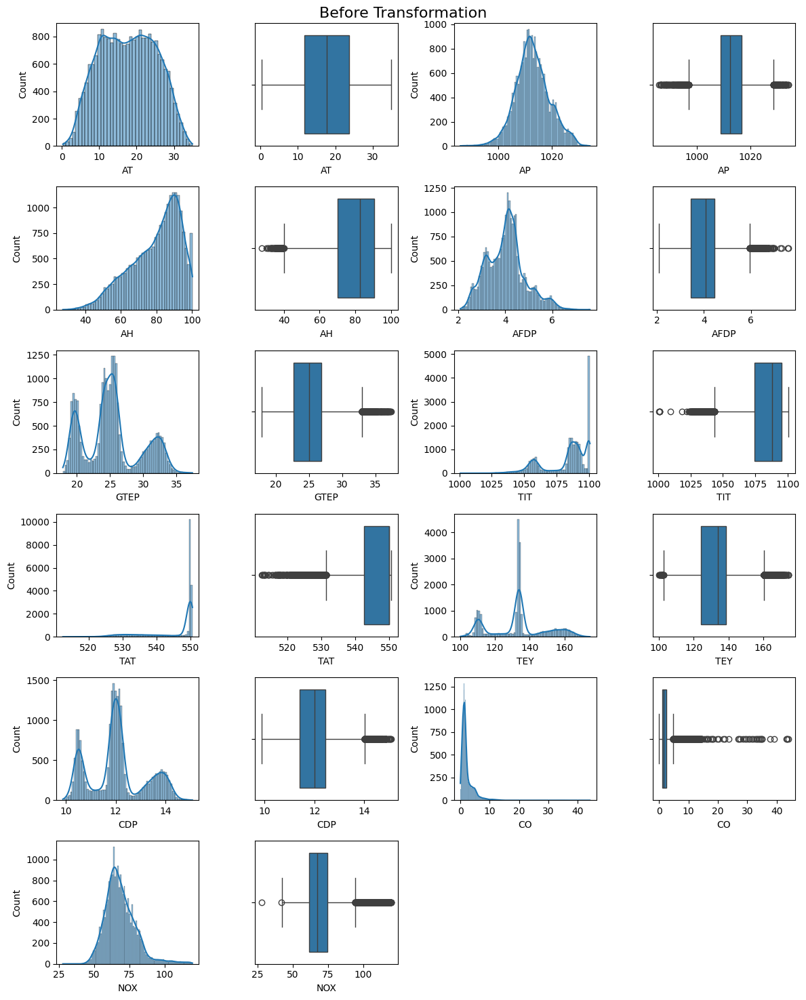

In [ ]:
# check distribution and outliers
column_names = df.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("Before Transformation", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=df[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=df[col])
plt.tight_layout()
plt.show()

In [ ]:
# check skewness
df.skew()

,0
AT,0.008795
AP,0.060079
AH,-0.717952
AFDP,0.375518
GTEP,0.389969
TIT,-1.025936
TAT,-1.498290
TEY,0.145320
CDP,0.269352
CO,4.932390


* AT	0.008795	Nearly symmetric (very low skew).	No transformation needed.
* AP	0.060079	Nearly symmetric (very low skew).	No transformation needed.
* AH	-0.717952	Moderately negatively skewed.	Apply np.square() or inverse.
* AFDP	0.375518	Mildly positively skewed.	No transformation needed (optional).
* GTEP	0.389969	Mildly positively skewed.	No transformation needed (optional).
* TIT	-1.025936	Strongly negatively skewed.	Apply np.square() or inverse.
* TAT	-1.498290	Highly negatively skewed.	Apply np.square() or inverse.
* TEY	0.145320	Nearly symmetric (very low skew).	No transformation needed.
* CDP	0.269352	Mildly positively skewed.	No transformation needed (optional).
* CO	4.932390	Highly positively skewed (extreme skew).	Apply np.log1p().
* NOX	1.113055	Strongly positively skewed.	Apply np.sqrt() or np.log1p()

In [ ]:
# transform skewed features
df['AH'] = np.square(df['AH'])
df['TIT'] = np.square(df['TIT'])
df['TAT'] = np.square(df['TAT'])
df['CO'] = np.log1p(df['CO'])
df['NOX'] = np.log1p(df['NOX'])

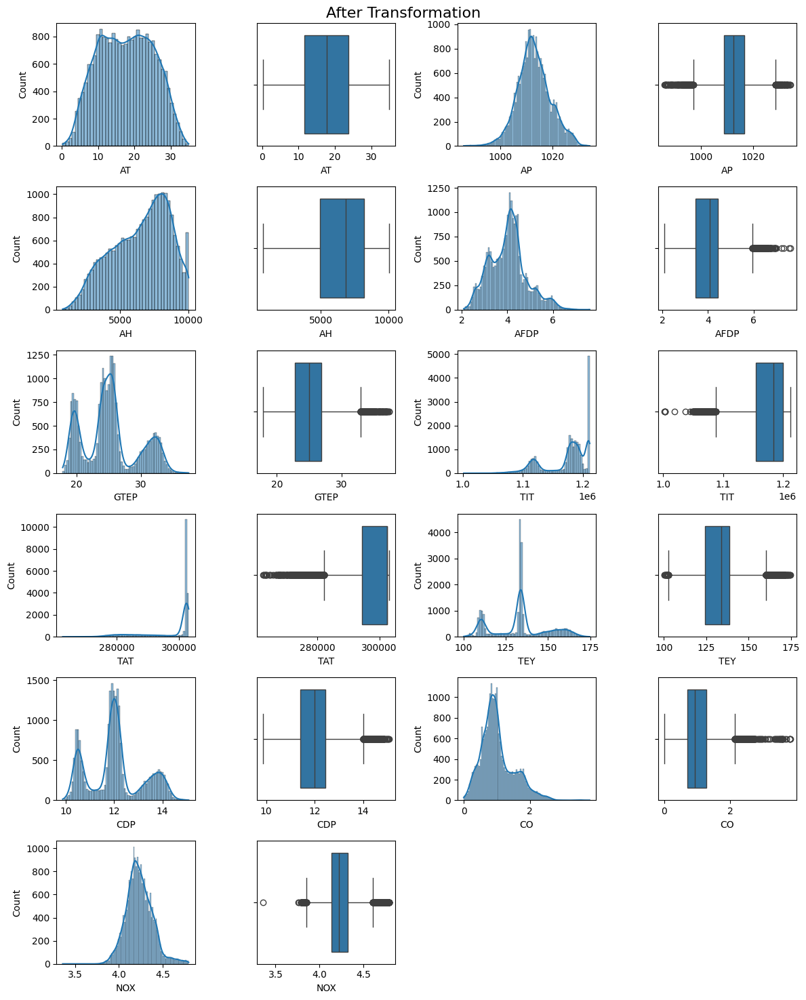

In [ ]:
# check distribution and outliers after skewness treatment
column_names = df.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("After Transformation", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=df[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=df[col])
plt.tight_layout()
plt.show()

In [ ]:
# check skew after transform
df.skew()

,0
AT,0.008795
AP,0.060079
AH,-0.383961
AFDP,0.375518
GTEP,0.389969
TIT,-1.003764
TAT,-1.484918
TEY,0.145320
CDP,0.269352
CO,0.901451


In [ ]:
df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,2.219100e+04,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.812607,6522.652738,4.037750,25.317873,1.173346e+06,297651.677255,133.537393,12.060208,1.018982,4.233604
std,7.352789,6.396588,2086.373921,0.810223,4.234147,3.618991e+04,8321.618186,16.026107,1.114265,0.503339,0.151014
min,0.289850,985.850000,756.470016,2.087400,17.878000,1.001601e+06,262605.002500,100.170000,9.875400,0.000387,3.359159
25%,11.664500,1008.800000,4941.316730,3.449850,22.736000,1.154765e+06,294414.760000,124.260000,11.395000,0.690832,4.135934
50%,17.739000,1012.400000,6852.693961,4.068800,24.989000,1.183962e+06,302390.010000,133.770000,12.001000,0.925924,4.220918
75%,23.657000,1016.700000,8196.043024,4.451400,26.839000,1.199682e+06,302555.002500,138.645000,12.443500,1.264804,4.325086
max,34.929000,1034.200000,10040.040000,7.610600,37.402000,1.211761e+06,303171.372100,174.610000,15.081000,3.808949,4.795046


## Handle Outliers

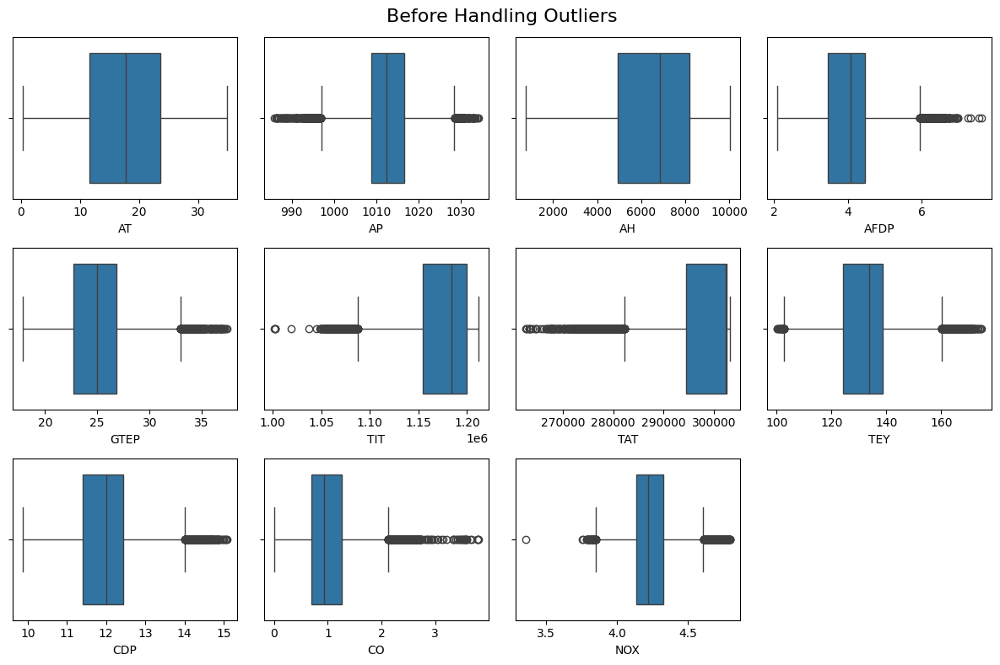

In [ ]:
# check outliers
column_names = df.columns.tolist()
index = 0
plt.figure(figsize=(12,8))
plt.suptitle("Before Handling Outliers", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(3,4,index)
    sns.boxplot(x=df[col])
plt.tight_layout()
plt.show()

#### Cap outliers with Zscore methode and make a new df 'zdf'

In [ ]:
zdf = df.copy() # make a df copy to make outlier capped df with z score methode
column_names = zdf.columns.tolist()
for col in column_names:               # loop through every column in zdf
    z_score = zscore(zdf[col])         # calculate the Z-score for the column
    outlier_mask = np.abs(z_score) > 3 # make mask of outliers
    upper_bound = zdf[col][~outlier_mask].max() # invert the mask and get the max of non outlier value
    lower_bound = zdf[col][~outlier_mask].min() # invert the mask and get the min of non outlier value
    zdf[col] = np.where(z_score > 3, upper_bound, np.where(z_score < -3, lower_bound, zdf[col])) # cap the outlier values

In [ ]:
df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,2.219100e+04,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.812607,6522.652738,4.037750,25.317873,1.173346e+06,297651.677255,133.537393,12.060208,1.018982,4.233604
std,7.352789,6.396588,2086.373921,0.810223,4.234147,3.618991e+04,8321.618186,16.026107,1.114265,0.503339,0.151014
min,0.289850,985.850000,756.470016,2.087400,17.878000,1.001601e+06,262605.002500,100.170000,9.875400,0.000387,3.359159
25%,11.664500,1008.800000,4941.316730,3.449850,22.736000,1.154765e+06,294414.760000,124.260000,11.395000,0.690832,4.135934
50%,17.739000,1012.400000,6852.693961,4.068800,24.989000,1.183962e+06,302390.010000,133.770000,12.001000,0.925924,4.220918
75%,23.657000,1016.700000,8196.043024,4.451400,26.839000,1.199682e+06,302555.002500,138.645000,12.443500,1.264804,4.325086
max,34.929000,1034.200000,10040.040000,7.610600,37.402000,1.211761e+06,303171.372100,174.610000,15.081000,3.808949,4.795046


In [ ]:
zdf.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,2.219100e+04,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.822323,6522.652738,4.037050,25.317873,1.173385e+06,297666.746621,133.537393,12.060208,1.017121,4.233091
std,7.352789,6.358006,2086.373921,0.807915,4.234147,3.606057e+04,8271.100931,16.026107,1.114265,0.496338,0.149176
min,0.289850,993.670000,756.470016,2.087400,17.878000,1.065024e+06,272703.284100,100.170000,9.875400,0.000387,3.788680
25%,11.664500,1008.800000,4941.316730,3.449850,22.736000,1.154765e+06,294414.760000,124.260000,11.395000,0.690832,4.135934
50%,17.739000,1012.400000,6852.693961,4.068800,24.989000,1.183962e+06,302390.010000,133.770000,12.001000,0.925924,4.220918
75%,23.657000,1016.700000,8196.043024,4.451400,26.839000,1.199682e+06,302555.002500,138.645000,12.443500,1.264804,4.325086
max,34.929000,1032.000000,10040.040000,6.467800,37.402000,1.211761e+06,303171.372100,174.610000,15.081000,2.527327,4.686197


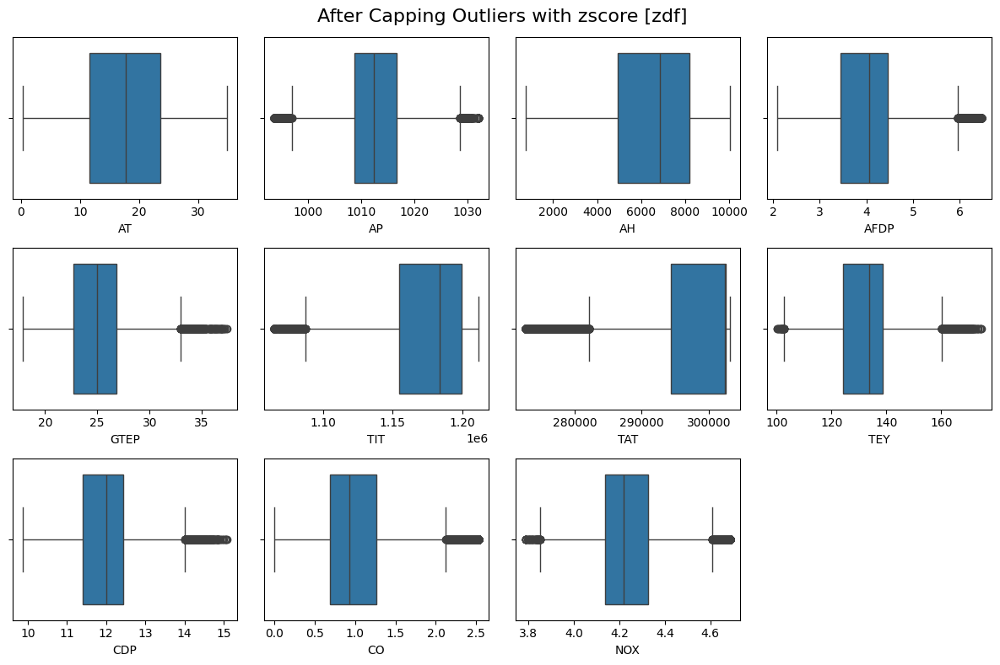

In [ ]:
# check outliers after capping with z score
column_names = zdf.columns.tolist()
index = 0
plt.figure(figsize=(12,8))
plt.suptitle("After Capping Outliers with zscore [zdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(3,4,index)
    sns.boxplot(x=zdf[col])
plt.tight_layout()
plt.show()

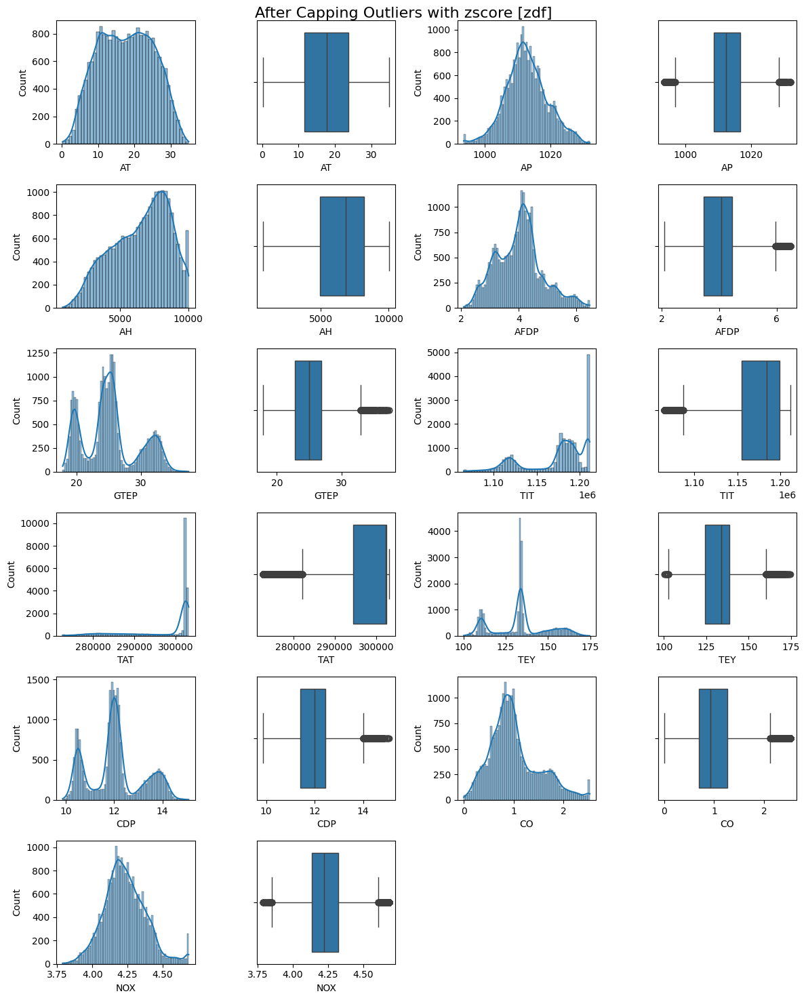

In [ ]:
column_names = zdf.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("After Capping Outliers with zscore [zdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=zdf[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=zdf[col])
plt.tight_layout()
plt.show()

In [ ]:
zdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


#### Cap outliers with IQR methode and make a new df 'IQRdf'

In [ ]:
IQRdf = df.copy() # make a df copy to make outlier capped df with IQR methode
column_names = IQRdf.columns.tolist()
for col in column_names:
    Q1 = IQRdf[col].quantile(0.25)
    Q3 = IQRdf[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    IQRdf[col] = np.where(IQRdf[col] < lower_bound, lower_bound, np.where(IQRdf[col] > upper_bound, upper_bound, IQRdf[col]))

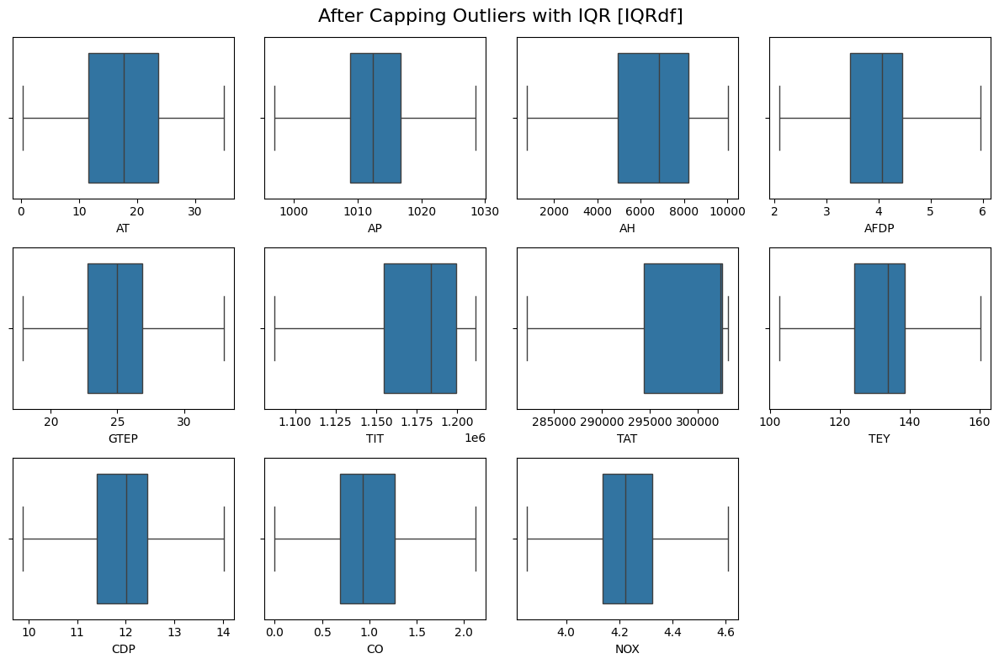

In [ ]:
# check outliers after capping with IQR
column_names = IQRdf.columns.tolist()
index = 0
plt.figure(figsize=(12,8))
plt.suptitle("After Capping Outliers with IQR [IQRdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(3,4,index)
    sns.boxplot(x=IQRdf[col])
plt.tight_layout()
plt.show()

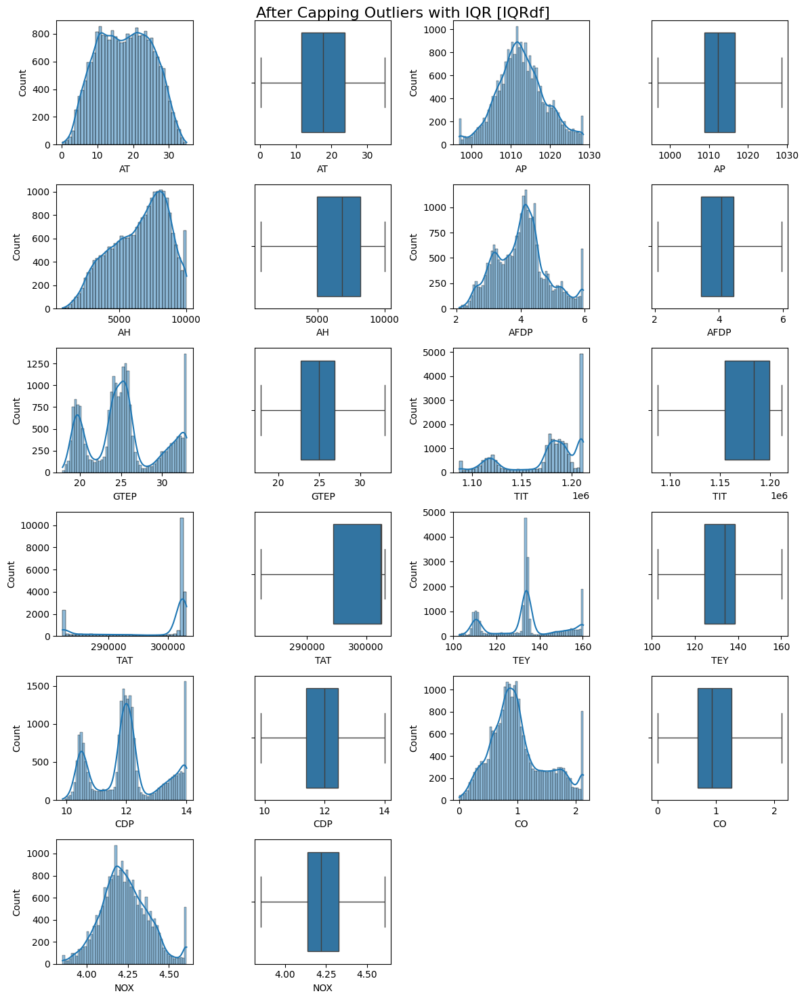

In [ ]:
column_names = IQRdf.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("After Capping Outliers with IQR [IQRdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=IQRdf[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=IQRdf[col])
plt.tight_layout()
plt.show()

### Scale features

In [ ]:
scalar = StandardScaler()
scaled_zdf = scalar.fit_transform(zdf)
scaled_IQRdf = scalar.fit_transform(IQRdf)

In [ ]:
scaled_zdf = pd.DataFrame(scaled_zdf,columns=zdf.columns)
scaled_IQRdf = pd.DataFrame(scaled_IQRdf,columns=IQRdf.columns)

In [ ]:
scaled_zdf.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,-1.785002,0.924474,0.229520,-0.570927,-0.316215,0.178754,0.561762,0.070674,-0.145577,-1.479829,1.241323
1,-1.825069,0.861559,0.274589,-0.576992,-0.322828,0.172730,0.591018,0.070674,-0.150962,-1.303674,1.275581
2,-1.877935,0.877288,0.325082,-0.562263,-0.313617,0.196830,0.609641,0.097506,-0.016341,-1.298670,1.387129
3,-1.899818,0.861559,0.372097,-0.564738,-0.332276,0.196830,0.606980,0.093138,-0.063009,-1.630452,1.285864
4,-1.898730,0.782917,0.351489,-0.568080,-0.330859,0.160684,0.584367,0.070674,-0.134807,-1.571743,1.247462


In [ ]:
scaled_zdf.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04
mean,-5.123106e-17,2.894555e-15,1.114275e-16,3.381250e-16,-1.460085e-16,-7.889583e-16,1.869934e-15,8.196969e-16,1.152699e-15,-1.229545e-16,-4.267547e-15
std,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00
min,-2.369548e+00,-3.012384e+00,-2.763796e+00,-2.413241e+00,-1.757152e+00,-3.005029e+00,-3.018223e+00,-2.082112e+00,-1.960806e+00,-2.048516e+00,-2.979170e+00
25%,-8.225291e-01,-6.326534e-01,-7.579522e-01,-7.268256e-01,-6.097876e-01,-5.163495e-01,-3.931834e-01,-5.789055e-01,-5.970058e-01,-6.574075e-01,-6.513006e-01
50%,3.638600e-03,-6.642539e-02,1.581925e-01,3.929933e-02,-7.767323e-02,2.933190e-01,5.710691e-01,1.451458e-02,-5.313727e-02,-1.837435e-01,-8.159729e-02
75%,8.085214e-01,6.099026e-01,8.020748e-01,5.128746e-01,3.592605e-01,7.292754e-01,5.910176e-01,3.187126e-01,3.439945e-01,4.990329e-01,6.167029e-01
max,2.341580e+00,3.016372e+00,1.685923e+00,3.008737e+00,2.854034e+00,1.064235e+00,6.655401e-01,2.562914e+00,2.711079e+00,3.042766e+00,3.037461e+00


In [ ]:
scaled_IQRdf.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,-1.785002,0.933804,0.229520,-0.573597,-0.313416,0.175741,0.576097,0.089100,-0.138798,-1.522521,1.278541
1,-1.825069,0.870159,0.274589,-0.579749,-0.320133,0.169627,0.608517,0.089100,-0.144281,-1.339498,1.313614
2,-1.877935,0.886070,0.325082,-0.564809,-0.310778,0.194088,0.629155,0.116755,-0.007200,-1.334300,1.427816
3,-1.899818,0.870159,0.372097,-0.567320,-0.329727,0.194088,0.626206,0.112253,-0.054721,-1.679016,1.324142
4,-1.898730,0.790603,0.351489,-0.570709,-0.328288,0.157400,0.601148,0.089100,-0.127831,-1.618018,1.284826


In [ ]:
scaled_IQRdf.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04
mean,-5.123106e-17,4.170208e-15,1.114275e-16,-2.766477e-16,2.766477e-16,-8.401893e-16,2.356629e-16,1.198807e-15,2.202935e-16,1.024621e-16,3.355634e-15
std,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00
min,-2.369548e+00,-2.526873e+00,-2.763796e+00,-2.442186e+00,-1.776838e+00,-2.426195e+00,-2.118087e+00,-1.968167e+00,-1.987194e+00,-2.113376e+00,-2.606348e+00
25%,-8.225291e-01,-6.414010e-01,-7.579522e-01,-7.317189e-01,-6.115697e-01,-5.297734e-01,-4.821245e-01,-5.804165e-01,-5.984749e-01,-6.680393e-01,-6.591009e-01
50%,3.638600e-03,-6.859931e-02,1.581925e-01,4.533227e-02,-7.115186e-02,2.920218e-01,5.864113e-01,3.121632e-02,-4.466888e-02,-1.759108e-01,-7.584656e-02
75%,8.085214e-01,6.155805e-01,8.020748e-01,5.256615e-01,3.726001e-01,7.345077e-01,6.085172e-01,3.447505e-01,3.597192e-01,5.334818e-01,6.390636e-01
max,2.341580e+00,2.501053e+00,1.685923e+00,2.411732e+00,1.848855e+00,1.074484e+00,6.910993e-01,1.732501e+00,1.797010e+00,2.335764e+00,2.586310e+00


In [ ]:
scaled_zdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


In [ ]:
scaled_IQRdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


<Figure size 1200x1200 with 0 Axes>

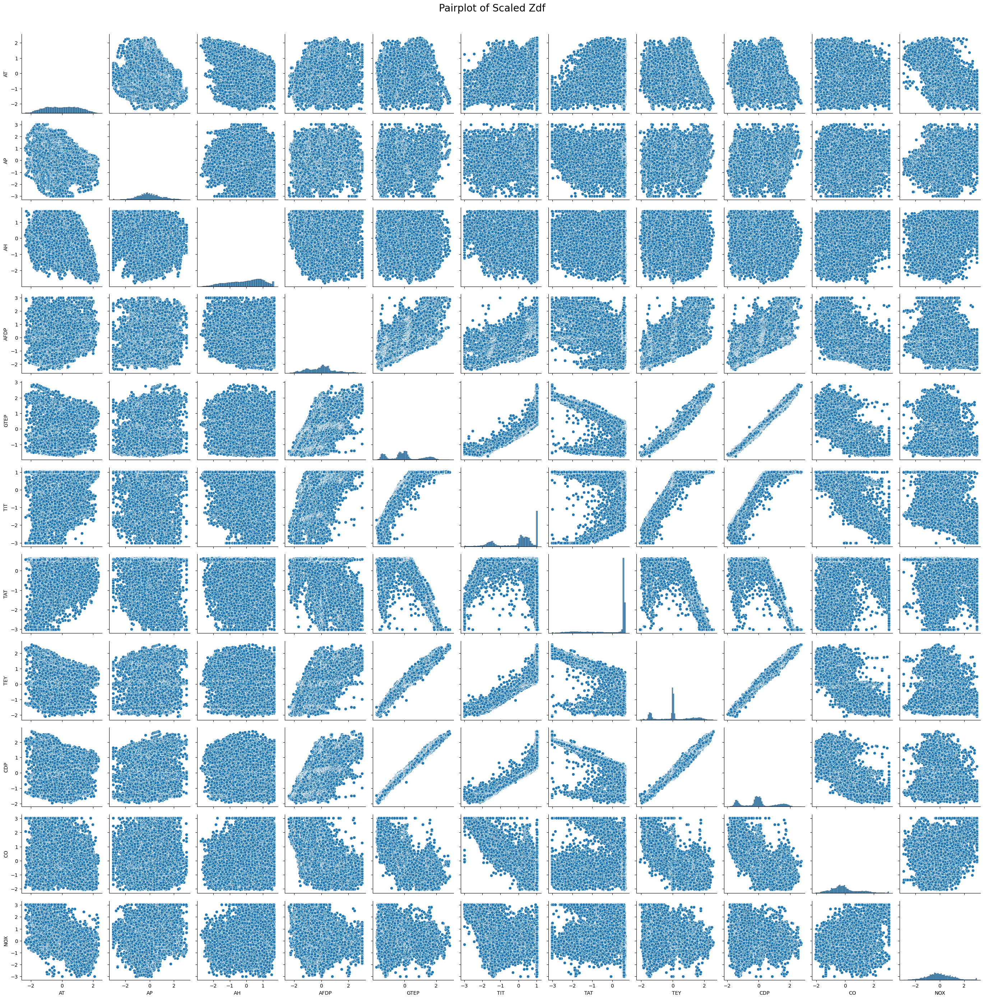

In [ ]:
plt.figure(figsize=(12,12))
g = sns.pairplot(scaled_zdf)
g._figure.suptitle('Pairplot of Scaled Zdf', fontsize=20, y=1.01)
plt.tight_layout()
plt.show()

<Figure size 1200x1200 with 0 Axes>

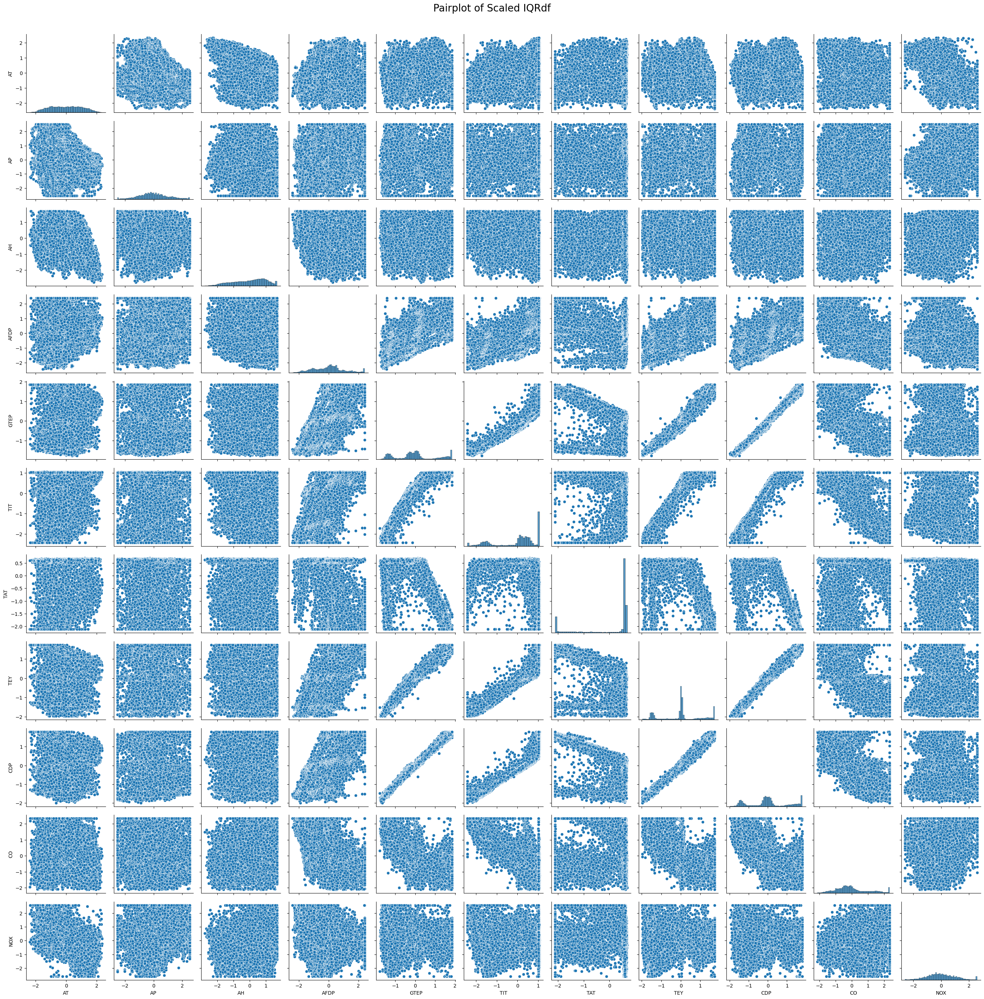

In [ ]:
plt.figure(figsize=(12,12))
g = sns.pairplot(scaled_IQRdf)
g._figure.suptitle('Pairplot of Scaled IQRdf', fontsize=20, y=1.01)
plt.tight_layout()
plt.show()

**Observations and Insights:**

* TEY and CDP (Compressor Discharge Pressure) have a strong positive linear correlation.
* TEY and GTEP (Gas Turbine Exhaust Pressure) have a strong positive linear correlation.
* Increases in CDP and GTEP suggest likely increases in TEY.
CDP and GTEP are likely to be strong predictors for TEY.

* TIT (Turbine Inlet Temperature) and GTEP (Gas Turbine Exhaust Pressure): notice a strong positive linear correlation between TIT and GTEP. This is expected as higher turbine inlet temperatures generally result in higher exhaust pressures.

In [ ]:
y_columns=[col for col in column_names if col != 'TEY' ]
y_columns

['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'CDP', 'CO', 'NOX']

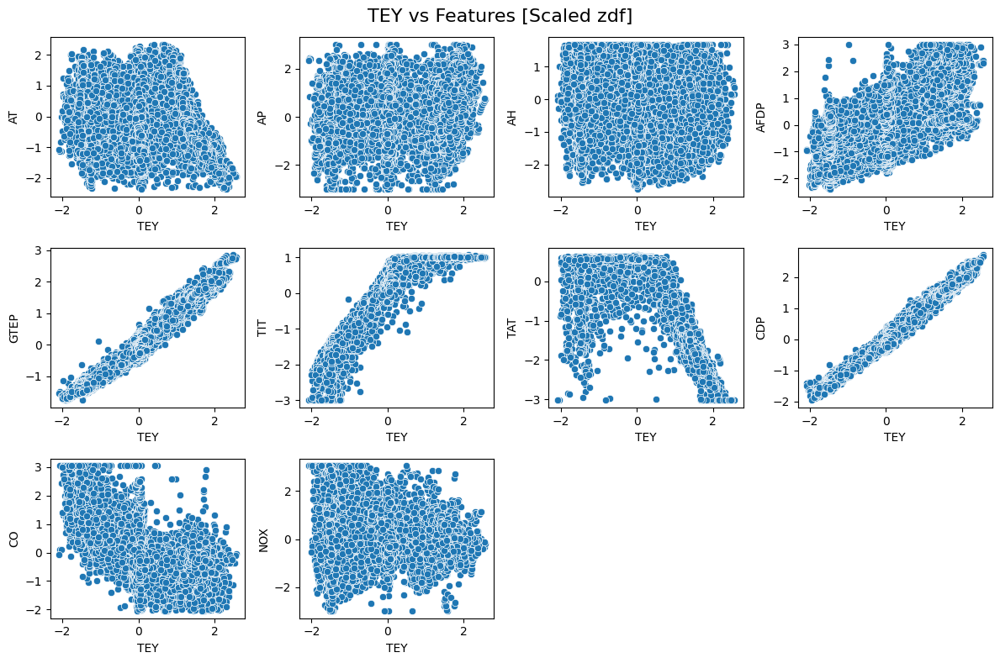

In [ ]:
plt.figure(figsize=(12,8))
plt.suptitle("TEY vs Features [Scaled zdf]", fontsize = 16)
index = 0
for col in y_columns:
    index+=1
    plt.subplot(3,4,index)
    sns.scatterplot(data=scaled_zdf , x='TEY', y=col)
plt.tight_layout()
plt.show()

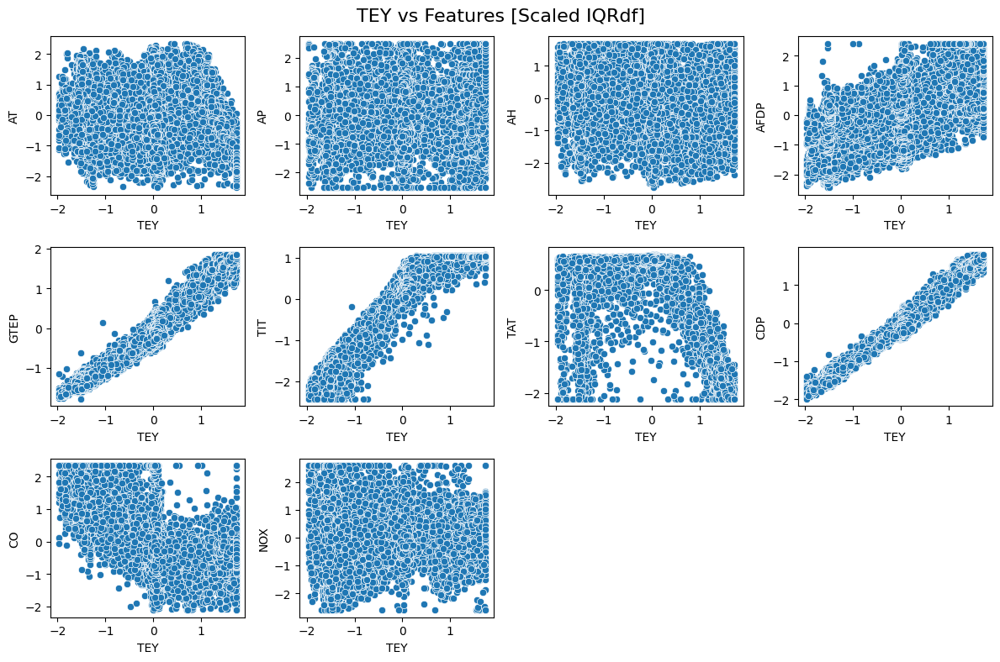

In [ ]:
plt.figure(figsize=(12,8))
plt.suptitle("TEY vs Features [Scaled IQRdf]", fontsize = 16)
index = 0
for col in y_columns:
    index+=1
    plt.subplot(3,4,index)
    sns.scatterplot(data=scaled_IQRdf , x='TEY', y=col)
plt.tight_layout()
plt.show()

**From the above analysis shows**
* TEY shows a strong positive correlation with GTEP, CDP, TIT.
* TEY shows a strong positive correlation with . This suggests that as CDP,GTEP,TIT increases, TEY tends to increase as well.
*  There might be a negative correlation between TEY and TAT and TEY and CO.
* Mild relationship between TEY and AFDP
* CDP , GTEP, TIT are better for predicting TEY

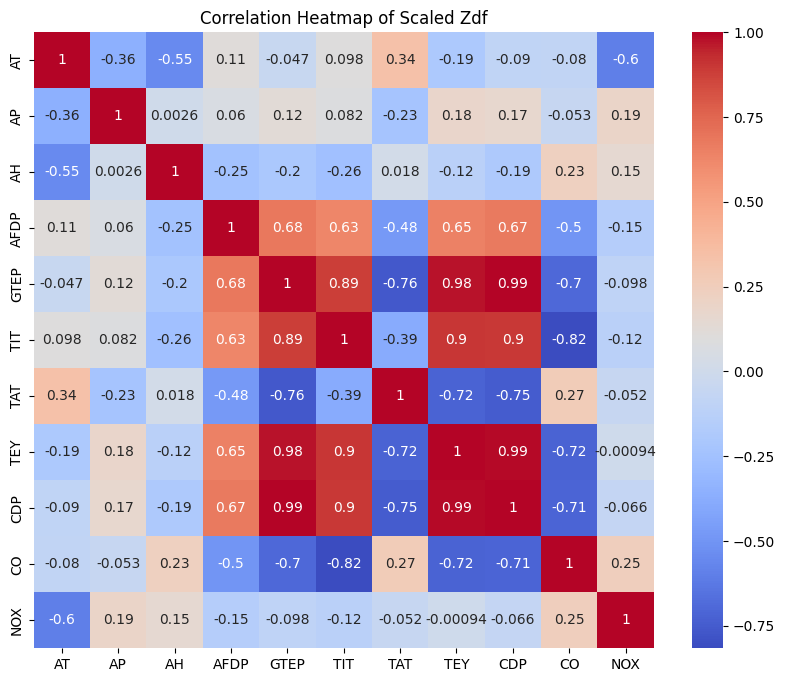

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(scaled_zdf.corr(),annot=True,cmap='coolwarm')
plt.title('Correlation Heatmap of Scaled Zdf')
plt.show()

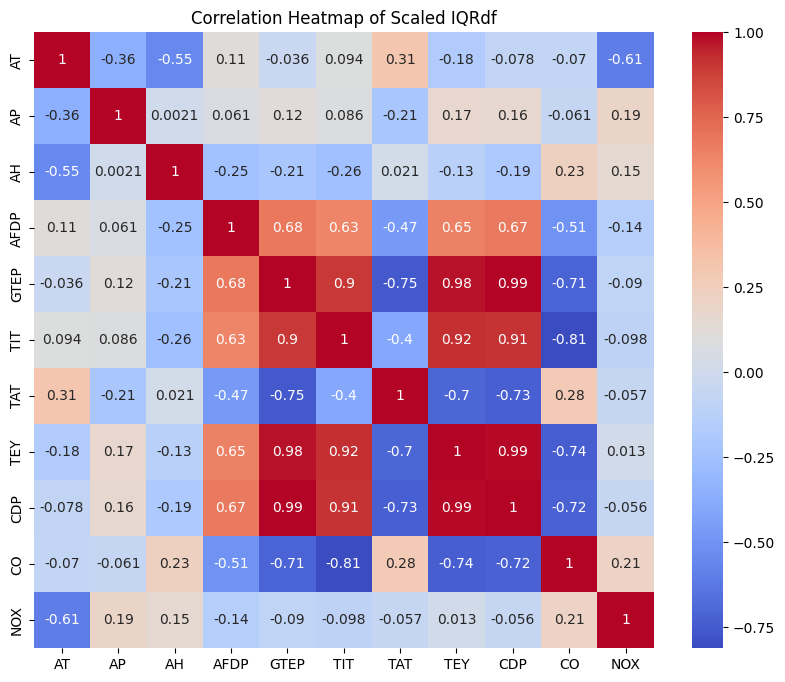

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(scaled_IQRdf.corr(),annot=True,cmap='coolwarm')
plt.title('Correlation Heatmap of Scaled IQRdf')
plt.show()

####**Key Observations from the Heatmap:**

**Strong Positive Correlations with TEY:**

CDP, GTEP, TIT, and AFDP shows strong positive correlations with TEY. This indicates that as these variables increase, TEY tends to increase as well.

Strong Negative Correlations with TEY:

CO and TAT show strong negative correlations with TEY. This means that as CO and TAT increase, TEY tends to decrease.

**Other Relationships:**

AT and AH have moderate negative correlations with TEY.
AP has a weak Positive correlation with TEY.

## Split the Data

In [ ]:
# train set
x_train_zdf = scaled_zdf.drop('TEY',axis=1)
y_train_zdf = scaled_zdf['TEY']
x_train_IQRdf = scaled_IQRdf.drop('TEY',axis=1)
y_train_IQRdf = scaled_IQRdf['TEY']

In [ ]:
# test set
x_test = test_df.drop('TEY',axis=1)
y_test = test_df['TEY']

In the above section we have to apply the feature selection methode before building model so we have to drop some x features according to the selection methode while model building

In [ ]:
x_test.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX
0,8.8358,1022.2,98.762,3.2422,23.152,1067.5,549.94,11.381,1.9157,68.292
1,9.0529,1021.8,97.464,3.2074,23.207,1067.9,549.80,11.476,2.0596,68.610
2,9.2464,1021.3,96.494,3.2051,23.296,1068.5,549.89,11.555,2.1621,68.324
3,9.3792,1020.9,95.912,3.2159,23.465,1069.6,549.94,11.539,2.1214,67.619
4,9.5757,1020.8,95.412,3.1898,23.205,1068.1,549.83,11.484,2.1549,66.499


In [ ]:
x_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14535 entries, 0 to 14534
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      14535 non-null  float64
 1   AP      14535 non-null  float64
 2   AH      14535 non-null  float64
 3   AFDP    14535 non-null  float64
 4   GTEP    14535 non-null  float64
 5   TIT     14535 non-null  float64
 6   TAT     14535 non-null  float64
 7   CDP     14535 non-null  float64
 8   CO      14535 non-null  float64
 9   NOX     14535 non-null  float64
dtypes: float64(10)
memory usage: 1.1 MB


In [ ]:
y_test.head()

,TEY
0,126.16
1,126.51
2,126.96
3,127.83
4,126.56


In [ ]:
y_test.info()

<class 'pandas.core.series.Series'>
RangeIndex: 14535 entries, 0 to 14534
Series name: TEY
Non-Null Count  Dtype  
--------------  -----  
14535 non-null  float64
dtypes: float64(1)
memory usage: 113.7 KB


In [ ]:
x_train_zdf.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX
0,-1.785002,0.924474,0.229520,-0.570927,-0.316215,0.178754,0.561762,-0.145577,-1.479829,1.241323
1,-1.825069,0.861559,0.274589,-0.576992,-0.322828,0.172730,0.591018,-0.150962,-1.303674,1.275581
2,-1.877935,0.877288,0.325082,-0.562263,-0.313617,0.196830,0.609641,-0.016341,-1.298670,1.387129
3,-1.899818,0.861559,0.372097,-0.564738,-0.332276,0.196830,0.606980,-0.063009,-1.630452,1.285864
4,-1.898730,0.782917,0.351489,-0.568080,-0.330859,0.160684,0.584367,-0.134807,-1.571743,1.247462


In [ ]:
x_train_IQRdf.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX
0,-1.785002,0.933804,0.229520,-0.573597,-0.313416,0.175741,0.576097,-0.138798,-1.522521,1.278541
1,-1.825069,0.870159,0.274589,-0.579749,-0.320133,0.169627,0.608517,-0.144281,-1.339498,1.313614
2,-1.877935,0.886070,0.325082,-0.564809,-0.310778,0.194088,0.629155,-0.007200,-1.334300,1.427816
3,-1.899818,0.870159,0.372097,-0.567320,-0.329727,0.194088,0.626206,-0.054721,-1.679016,1.324142
4,-1.898730,0.790603,0.351489,-0.570709,-0.328288,0.157400,0.601148,-0.127831,-1.618018,1.284826


In [ ]:
x_train_zdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   CDP     22191 non-null  float64
 8   CO      22191 non-null  float64
 9   NOX     22191 non-null  float64
dtypes: float64(10)
memory usage: 1.7 MB


In [ ]:
x_train_IQRdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   CDP     22191 non-null  float64
 8   CO      22191 non-null  float64
 9   NOX     22191 non-null  float64
dtypes: float64(10)
memory usage: 1.7 MB


In [ ]:
y_train_zdf.head()

,TEY
0,0.070674
1,0.070674
2,0.097506
3,0.093138
4,0.070674


In [ ]:
y_train_IQRdf.head()

,TEY
0,0.089100
1,0.089100
2,0.116755
3,0.112253
4,0.089100


In [ ]:
y_train_zdf.info()

<class 'pandas.core.series.Series'>
RangeIndex: 22191 entries, 0 to 22190
Series name: TEY
Non-Null Count  Dtype  
--------------  -----  
22191 non-null  float64
dtypes: float64(1)
memory usage: 173.5 KB


In [ ]:
y_train_IQRdf.info()

<class 'pandas.core.series.Series'>
RangeIndex: 22191 entries, 0 to 22190
Series name: TEY
Non-Null Count  Dtype  
--------------  -----  
22191 non-null  float64
dtypes: float64(1)
memory usage: 173.5 KB
